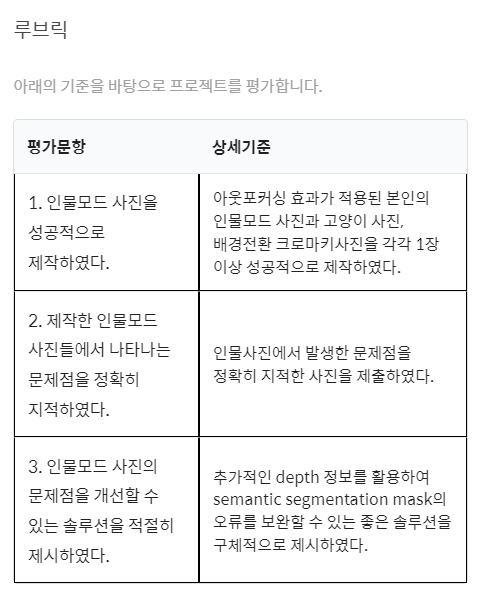

1. 인물 인식하기
    - 최소 3장이상
    - 고양이에 적용해보기
    - 배경 사진을 bluring해보기
2. 사진에서 문제점 찾기
    - 옷이 인물영역에 포함되어 blur되지 않고 나온다거나.
3. 해결 방법을 제안해보기
    - 세그멘테이션의 한계
        - semantic segmentation의 부정확성이 여러 문제를 발생시키는 주요 원인 입니다. 피사계 심도를 이용한 보케(아웃포커싱)효과는 말 그대로 심도를 표현하기 때문에 초점이 잡힌 거리를 광학적으로 아주 섬세하게 구별하지만, 이를 따라 한 semantic segmentation 모듈은 정홛고가 1.00이 되지 않은 한 완벽히 구현하기는 힘듭니다.
    - 피사계 심도 이해하기
        - 아웃포커싱 하는 법
        https://m.blog.naver.com/typs6301/222172333739
        - 얕은 피사계 심도 촬영의 이해
        https://www.adobe.com/kr/creativecloud/photography/discover/shallow-depth-of-field.html
    - 3D Camera 활용하기
        - 이미지를 2D 방식으로 받아들이는 한계를 넘어 3D로 인식하려는 시도는 꽤 오래전부터 계속되어 왔습니다. 기술도 이제는 상당한 수준에 이르렀는데요. 크게는 스테레오 비전, ToF 방식 등이 자주 사용됩니다. 하드웨어 이미지 센서를 통한 3D 이미징 기술이 많이 발전되었는데요. 아래 참고 자료를 통해 최신 기술을 살펴봐도 좋습니다.
        - https://news.skhynix.co.kr/post/next-gen-3d
    - 소프트웨어 기술 활용하기
        - 하드웨어 개발과 생산에는 비용이 많이 들기 때문에 제한된 하드웨어를 이용하면서 소프트웨어로 그 한계를 극복하려는 노력도 많습니다. 구글의 struct2Depth가 대표적인 예일 것 같습니다.
        - https://sites.google.com/view/struct2depth
    - 다른 기술과 융합해보기
        - 구글 pixel4에는 IR(적외선) 카메라가 달려있는데요. 물체의 온도를 측정하는 IR 카메라와 3D 이미지는 크게 관련이 없을 것 같지만, 이를 통해 보다 멋진 3d depth sensing이 가능하다는군요.
        - https://ai.googleblog.com/2020/04/udepth-real-time-3d-depth-sensing-on.html
        - 이렇게 카메라와 무관한 다른 기술과 융합하는 것도 좋은 해결책이 될 수 있습니다. 한 번 고민해 보세요!

이 외에도 다른 방식으로 접근해도 좋습니다. 엔지니어로서 본인이 선택한 솔루션을 잘 설명해 주세요. 가능하다면 순서도(Flow Chart)를 활용하면 좋습니다. 멋진 아이디어를 기대하겠습니다!!

오늘은 객체를 인식하여 배경과 분리하고, 배경에 효과를 준 후 원본사진과 합성하는 프로젝트를 진행해보았습니다.


인물사진 2장과 고양이 사진 1장을 이용하였습니다.


인물사진에서는 인물을 인식하여 배경과 분리하고, 배경은 blurring 효과를 주었습니다. 그리고 인물영역에는 원본사진을, 인물영역 외의 영역에는 blurring된 배경을 합성함으로써 아웃포커싱이 적용된 사진처럼 수정하였습니다.


고양이 사진에서도 동일하게 고양이를 인식하여 배경과 분리를 합니다. 배경부분에는 다른사진을 덮어씌우고, 원본사진과 합성하여 크로마키가 진행된 것 처럼 수정하였습니다.


# 1. 사진 불러오기

In [1]:
import os
import urllib
import cv2
import numpy as np
from pixellib.semantic import semantic_segmentation
from matplotlib import pyplot as plt

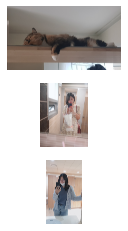

In [2]:
img_path_saja = os.getenv('HOME')+'/aiffel/human_segmentation/images/saja.jpg'
img_path_me2 = os.getenv('HOME')+'/aiffel/human_segmentation/images/ME8.jpg'
img_path_me3 = os.getenv('HOME')+'/aiffel/human_segmentation/images/ME6.jpg'
img_saja = cv2.imread(img_path_saja)
img_me2 = cv2.imread(img_path_me2)
img_me3 = cv2.imread(img_path_me3)

fig = plt.figure()
rows = 3
cols = 1

ax0 = fig.add_subplot(rows, cols, 1)
ax0.imshow(cv2.cvtColor(img_saja, cv2.COLOR_BGR2RGB))
ax0.axis("off")

ax1 = fig.add_subplot(rows, cols, 2)
ax1.imshow(cv2.cvtColor(img_me2, cv2.COLOR_BGR2RGB))
ax1.axis("off")

ax3 = fig.add_subplot(rows, cols, 3)
ax3.imshow(cv2.cvtColor(img_me3, cv2.COLOR_BGR2RGB))
ax3.axis("off")

plt.show()

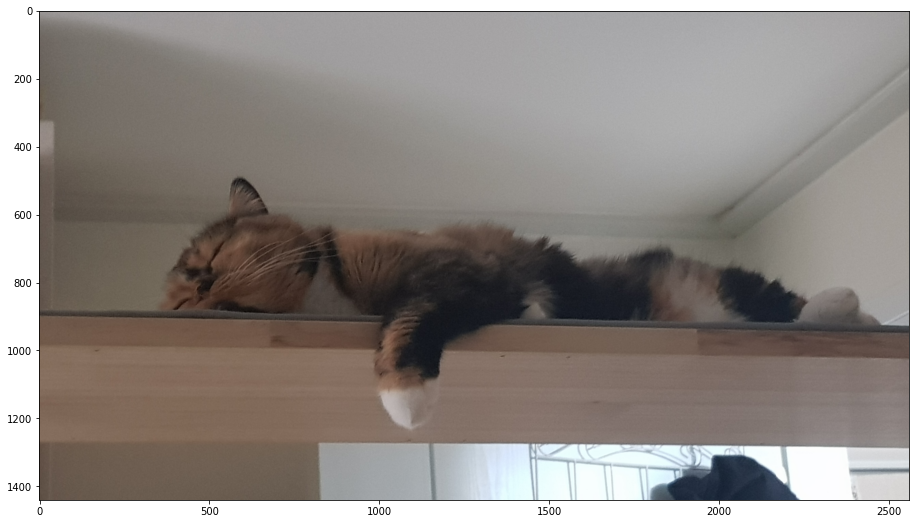

In [46]:
# 잘안보여서 확대했습니다.

plt.rcParams["figure.figsize"] = (16,9)
plt.imshow(cv2.cvtColor(img_saja, cv2.COLOR_BGR2RGB))
plt.show()

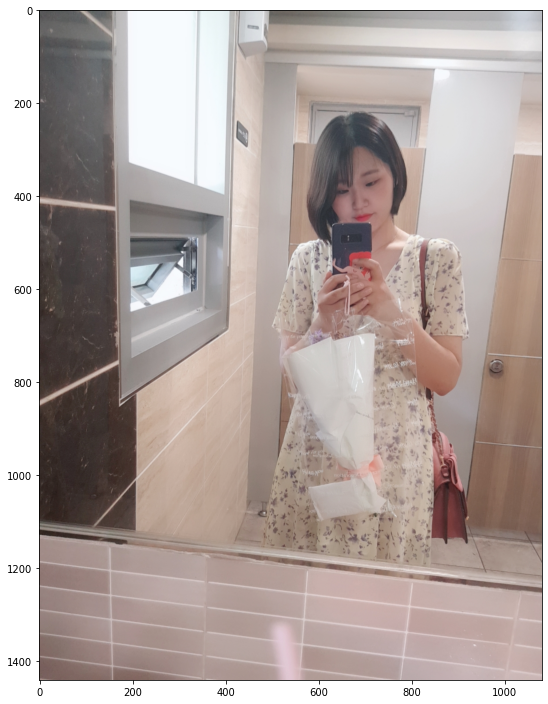

In [4]:
plt.rcParams["figure.figsize"] = (9,16)
plt.imshow(cv2.cvtColor(img_me2, cv2.COLOR_BGR2RGB))
plt.show()

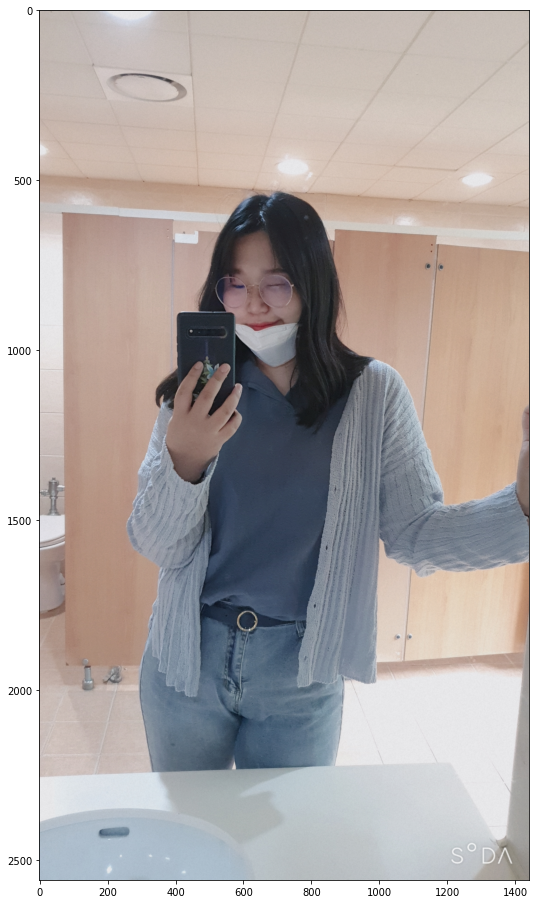

In [5]:
plt.rcParams["figure.figsize"] = (9,16)
plt.imshow(cv2.cvtColor(img_me3, cv2.COLOR_BGR2RGB))
plt.show()

# 2. 세그멘테이션으로 객체분리하기

In [6]:
# PixelLib 모델 다운로드
# 저장할 파일 이름을 결정합니다
model_dir = os.getenv('HOME')+'/aiffel/human_segmentation/models'
model_file = os.path.join(model_dir, 'deeplabv3_xception_tf_dim_ordering_tf_kernels.h5')

# PixelLib가 제공하는 모델의 url입니다
model_url = 'https://github.com/ayoolaolafenwa/PixelLib/releases/download/1.1/deeplabv3_xception_tf_dim_ordering_tf_kernels.h5'

# 다운로드를 시작합니다
urllib.request.urlretrieve(model_url, model_file)

('/aiffel/aiffel/human_segmentation/models/deeplabv3_xception_tf_dim_ordering_tf_kernels.h5',
 <http.client.HTTPMessage at 0x7fe4fde76c10>)

In [7]:
model = semantic_segmentation()
model.load_pascalvoc_model(model_file)

print("model id", id(model))

segvalues_saja, output_saja = model.segmentAsPascalvoc(img_path_saja)
print(id(segvalues_saja), id(output_saja))

segvalues_me2, output_me2 = model.segmentAsPascalvoc(img_path_me2)
print(id(segvalues_me2), id(output_me2))

segvalues_me3, output_me3 = model.segmentAsPascalvoc(img_path_me3)
print(id(segvalues_me3), id(output_me3))

# Pascal VOL 데이터 라벨 종류

LABEL_NAMES = [
    'background', 'aeroplane', 'bicycle', 'bird', 'boat', 'bottle', 'bus',
    'car', 'cat', 'chair', 'cow', 'diningtable', 'dog', 'horse', 'motorbike',
    'person', 'pottedplant', 'sheep', 'sofa', 'train', 'tv'
]
len(LABEL_NAMES)

model id 140621488896032
140621487603904 140616694950480
140616696832256 140616694948752
140616741565568 140617702863280


21

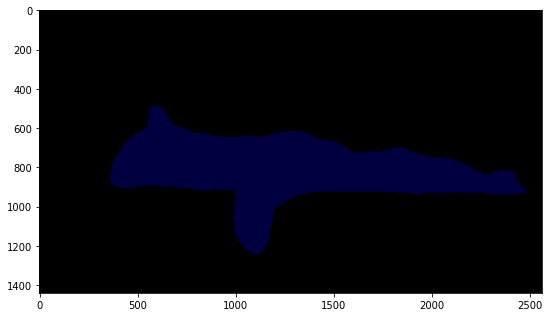

In [8]:
plt.imshow(output_saja)
plt.show()

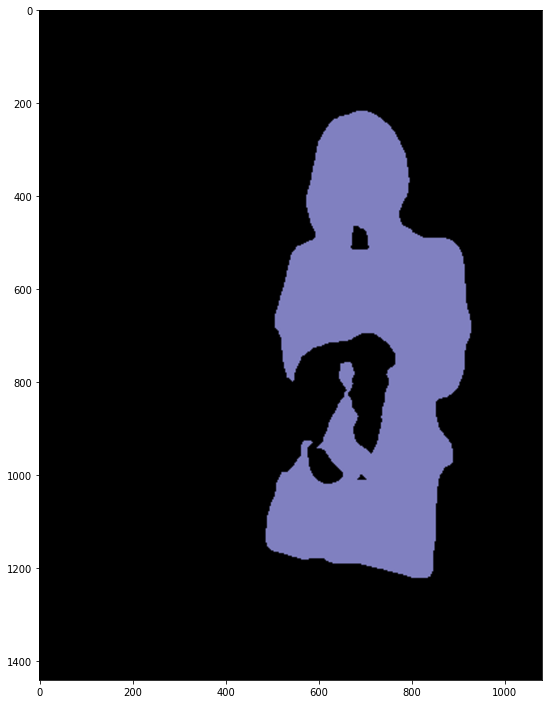

In [9]:
plt.imshow(output_me2)
plt.show()

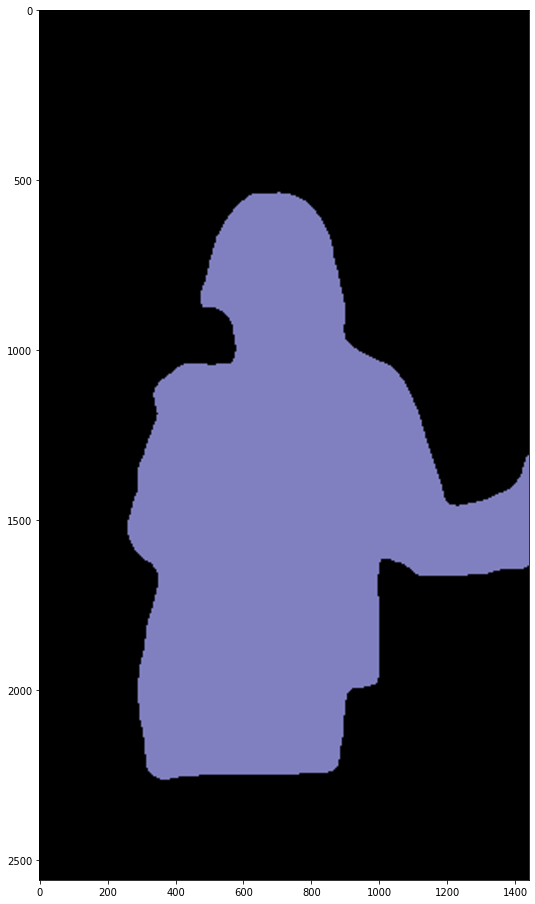

In [10]:
plt.imshow(output_me3)
plt.show()

In [11]:
for class_id in segvalues_saja['class_ids']:
    print(LABEL_NAMES[class_id])

background
cat


In [12]:
for class_id in segvalues_me2['class_ids']:
    print(LABEL_NAMES[class_id])

background
person


In [13]:
for class_id in segvalues_me3['class_ids']:
    print(LABEL_NAMES[class_id])

background
person


# 3. 고양이 사진에 크로마키 제작하기

3-1. 고양이 객체 인식하기
----

In [14]:
# 고양이의 세그멘테이션 색깔 추출하기
colormap_saja = np.zeros((256, 3), dtype = int)
ind = np.arange(256, dtype=int)

for shift in reversed(range(8)):
    for channel in range(3):
        colormap_saja[:, channel] |= ((ind >> channel) & 1) << shift
    ind >>= 3

print(colormap_saja[:20])

print("8th colormap :",colormap_saja[8])

[[  0   0   0]
 [128   0   0]
 [  0 128   0]
 [128 128   0]
 [  0   0 128]
 [128   0 128]
 [  0 128 128]
 [128 128 128]
 [ 64   0   0]
 [192   0   0]
 [ 64 128   0]
 [192 128   0]
 [ 64   0 128]
 [192   0 128]
 [ 64 128 128]
 [192 128 128]
 [  0  64   0]
 [128  64   0]
 [  0 192   0]
 [128 192   0]]
8th colormap : [64  0  0]


(1440, 2560)


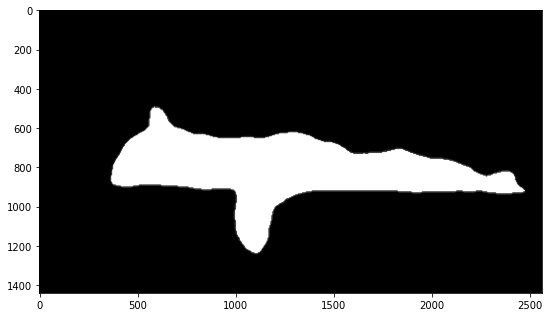

In [15]:
seg_color_saja = (0,0,64)

seg_map_saja = np.all(output_saja==seg_color_saja, axis=-1)
print(seg_map_saja.shape)
plt.imshow(seg_map_saja, cmap='gray')
plt.show()

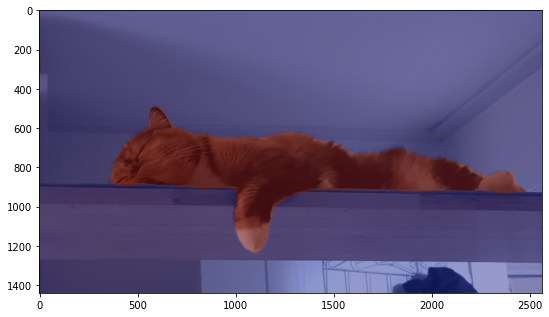

In [16]:
# 원래이미지와 곂쳐보기

img_show_saja = img_saja.copy()

# True과 False인 값을 각각 255과 0으로 바꿔줍니다
img_mask_saja = seg_map_saja.astype(np.uint8) * 255

# 255와 0을 적당한 색상으로 바꿔봅니다
color_mask_saja = cv2.applyColorMap(img_mask_saja, cv2.COLORMAP_JET)

# 원본 이미지와 마스트를 적당히 합쳐봅니다
# 0.6과 0.4는 두 이미지를 섞는 비율입니다.
img_show_saja = cv2.addWeighted(img_show_saja, 0.6, color_mask_saja, 0.4, 0.0)

plt.imshow(cv2.cvtColor(img_show_saja, cv2.COLOR_BGR2RGB))


3-2 고양이 배경에 크로마키 적용하기
--------

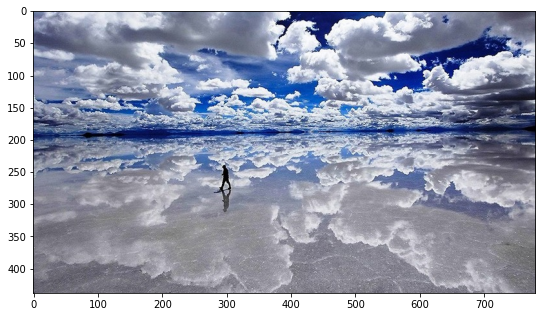

In [17]:
# 크로마키 적용할 배경 가져오기

img_path_sky = os.getenv('HOME')+'/aiffel/human_segmentation/images/sky.jpg'
img_sky = cv2.imread(img_path_sky)

plt.imshow(cv2.cvtColor(img_sky, cv2.COLOR_BGR2RGB))
plt.show()

In [18]:
img_sky.shape

(438, 780, 3)

In [19]:
img_saja.shape

(1440, 2560, 3)

배경 이미지와 고양이 사진의 이미지 크기가 매우 다르기 떄문에, 배경 이미지 크기를 키워주었습니다.

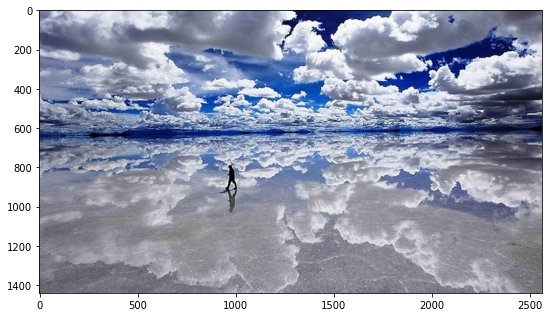

In [20]:
img_sky = cv2.resize(img_sky, dsize=(2560, 1440), interpolation=cv2.INTER_CUBIC)

plt.imshow(cv2.cvtColor(img_sky, cv2.COLOR_BGR2RGB))
plt.show()

고양이 객체부분만 두고, 배경부분을 하얀색으로 처리해주었습니다.

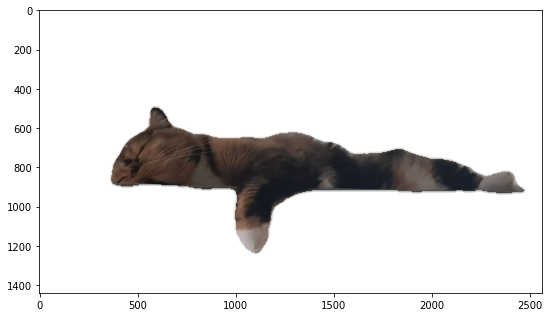

In [21]:
img_mask_color_saja = cv2.cvtColor(img_mask_saja, cv2.COLOR_GRAY2BGR)
img_saja_bg_white = cv2.bitwise_not(img_mask_color_saja)
img_saja_bg_white = np.where(img_saja_bg_white<200, img_saja, img_saja_bg_white)
plt.imshow(cv2.cvtColor(img_saja_bg_white, cv2.COLOR_BGR2RGB))
plt.show()

np.where 메소드로 배경이 하얀 부분에 구름을 넣어주었습니다.

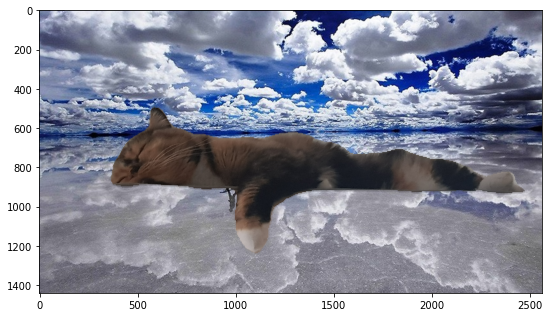

In [22]:
img_res_saja = np.where(img_saja_bg_white>200, img_sky, img_saja)
plt.imshow(cv2.cvtColor(img_res_saja, cv2.COLOR_BGR2RGB))
plt.show()

합성하고 보니 고양이의 위치와 배경의 위치가 너무 안어울려서 이미지를 이동할 필요성을 느꼈습니다.
다음 링크를 참고하여 고양이의 이미지를 위쪽으로 평행이동 시켜주었습니다.
https://bkshin.tistory.com/entry/OpenCV-13-%EC%9D%B4%EB%AF%B8%EC%A7%80-%EC%9D%B4%EB%8F%99Translation-%ED%99%95%EB%8C%80%EC%B6%95%EC%86%8CScaling-%ED%9A%8C%EC%A0%84Rotation

1440 2560


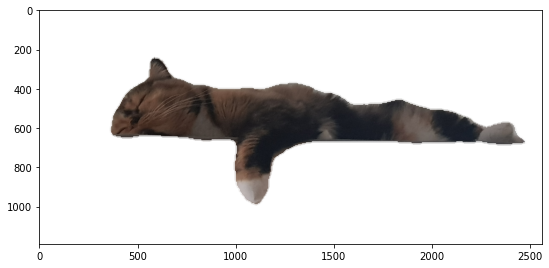

(1190, 2560, 3)


In [23]:
rows, cols = img_saja_bg_white.shape[0:2]
print(rows, cols)

dx, dy = 0, -250  

mtrx = np.float32([[1, 0, dx],
                   [0, 1, dy]])  

test_saja = cv2.warpAffine(img_saja_bg_white, mtrx, (cols+dx, rows+dy), None, \
                        cv2.INTER_LINEAR, cv2.BORDER_CONSTANT, (255,255,255) )  
plt.imshow(cv2.cvtColor(test_saja, cv2.COLOR_BGR2RGB))
plt.show()

print(test_saja.shape)



줄어든 이미지크기 만큼 하얀색 이미지를 추가해주었습니다.
여기 링크를 참고했습니다.
- 이미지 자르기
https://durian9s-coding-tree.tistory.com/77
- 이미지 붙이기
https://copycoding.tistory.com/159

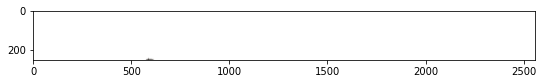

(250, 2560, 3)


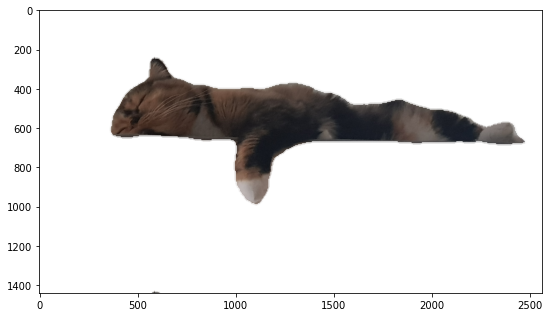

(1440, 2560, 3)


In [24]:
# 이미지 잘라옴
crop_img = test_saja[0:250,:]
plt.imshow(cv2.cvtColor(crop_img, cv2.COLOR_BGR2RGB))
plt.show()

print(crop_img.shape)

# 이미지 붙이기
img_res_saja = np.vstack((test_saja, crop_img))
plt.imshow(cv2.cvtColor(img_res_saja, cv2.COLOR_BGR2RGB))
plt.show()

print(img_res_saja.shape)

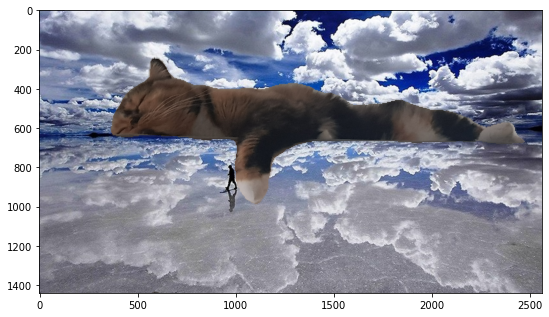

In [25]:
img_res_saja = np.where(img_res_saja>200, img_sky, img_res_saja)
plt.imshow(cv2.cvtColor(img_res_saja, cv2.COLOR_BGR2RGB))
plt.show()

마음에 드네요 ^_\^/ 회전변환까진 안해줘도 괜찮네요~!

# 4. 인물사진에 블러 처리하기

4-1 인물 인식 하기
-------

사람 객체의 색상을 불러와 객체인식을 먼저하겠습니다.

In [26]:
colormap_me2 = np.zeros((256, 3), dtype = int)
ind = np.arange(256, dtype=int)

for shift in reversed(range(8)):
    for channel in range(3):
        colormap_me2[:, channel] |= ((ind >> channel) & 1) << shift
    ind >>= 3

print(colormap_me2[:20])

print(colormap_me2[15])

[[  0   0   0]
 [128   0   0]
 [  0 128   0]
 [128 128   0]
 [  0   0 128]
 [128   0 128]
 [  0 128 128]
 [128 128 128]
 [ 64   0   0]
 [192   0   0]
 [ 64 128   0]
 [192 128   0]
 [ 64   0 128]
 [192   0 128]
 [ 64 128 128]
 [192 128 128]
 [  0  64   0]
 [128  64   0]
 [  0 192   0]
 [128 192   0]]
[192 128 128]


(1440, 1080)


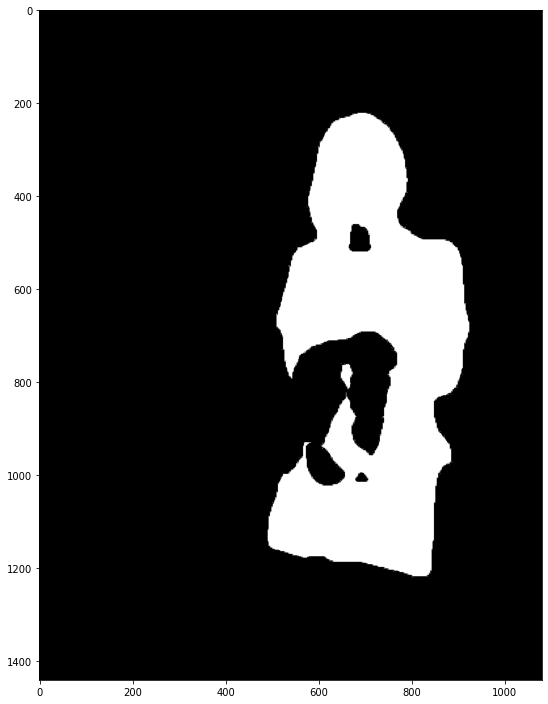

In [27]:
seg_color_person = (128,128,192)

seg_map_me2 = np.all(output_me2==seg_color_person, axis=-1)
print(seg_map_me2.shape)
plt.imshow(seg_map_me2, cmap='gray')
plt.show()

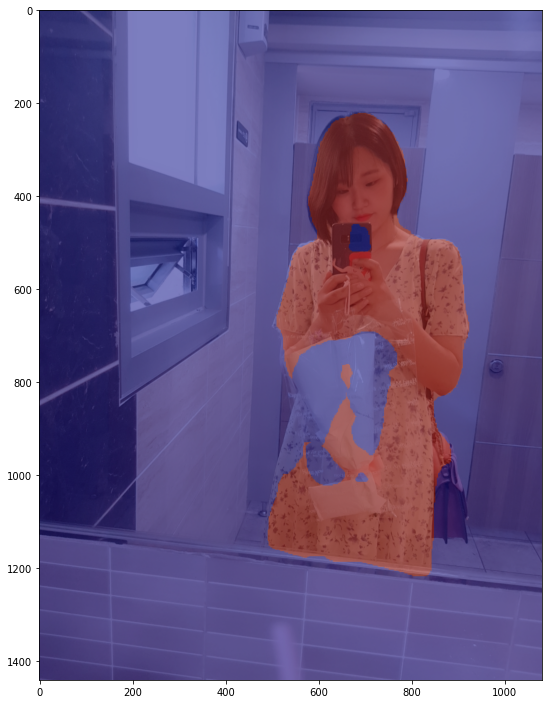

In [28]:
# 원래 이미지와 겹쳐 보면 세그멘테이션이 얼마나 잘 되었는지 알아보기 쉬울 것 같네요.

img_show_me2 = img_me2.copy()

# True과 False인 값을 각각 255과 0으로 바꿔줍니다
img_mask_me2 = seg_map_me2.astype(np.uint8) * 255

# 255와 0을 적당한 색상으로 바꿔봅니다
color_mask_me2 = cv2.applyColorMap(img_mask_me2, cv2.COLORMAP_JET)

# 원본 이미지와 마스트를 적당히 합쳐봅니다
# 0.6과 0.4는 두 이미지를 섞는 비율입니다.
img_show_me2 = cv2.addWeighted(img_show_me2, 0.5, color_mask_me2, 0.5, 0.0)

plt.imshow(cv2.cvtColor(img_show_me2, cv2.COLOR_BGR2RGB))
plt.show()

4-2 빵꾸난 객체인식 빵꾸 메꾸기
----

물론, 꽃이 저는 아니지만^^ 꽃다발 덕분에 제 객체 인식이 잘못되었다는 것을 알 수 있습니다. 저부분을 다 채워주거나 혹은 꽃 다발부분을 crop 해야함을 알 수 있습니다.

저는 이 과정을 (잘 될지는 모르겠지만) 영상처리의 닫힘연산을 이용해서 구멍을 채워보려 합니다. 꽃다발의 부분이 크게 뻥 뚫렸기 때문에, 두번 팽창하고 한번 닫힘을 처리하여 이미지가 어떻게 변하는지 확인해보려 합니다.

참고 이론 : chrome-extension://efaidnbmnnnibpcajpcglclefindmkaj/viewer.html?pdfurl=http%3A%2F%2Fdongseo.ac.kr%2F~dkkang%2FImageProcessing2011Spring%2Fch11.pdf&clen=1762442&chunk=true
참고 코드 : 
- 열림 / 닫힘 / 팽창 / 침식 : https://deep-learning-study.tistory.com/226

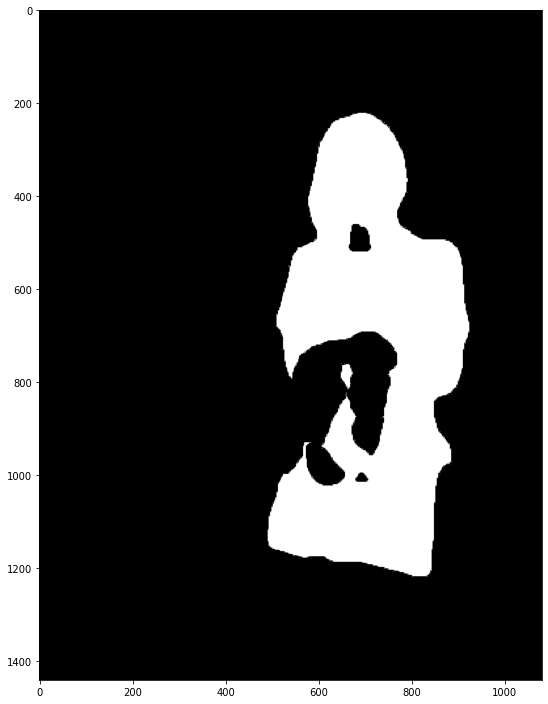

In [29]:
# 기존 흑백 이미지
binary = cv2.cvtColor(img_mask_me2, cv2.COLOR_BGR2RGB)
plt.imshow(binary)
plt.show()

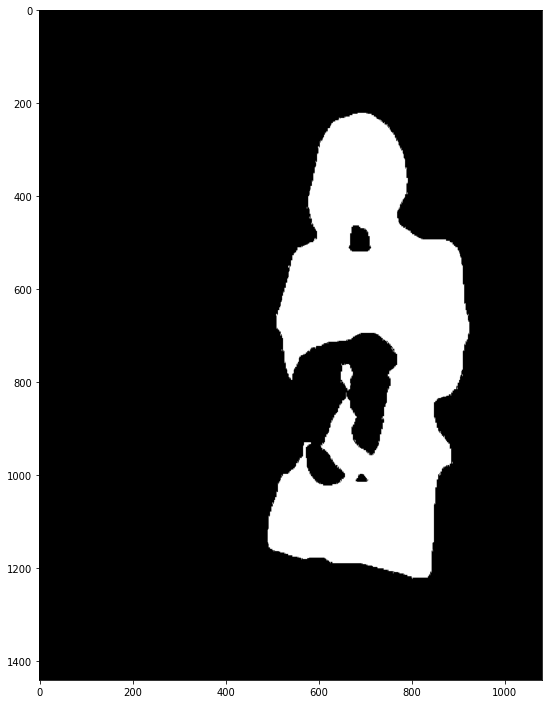

In [30]:
# 흑백영상에 팽창연산을 해주었습니다.
binary = cv2.cvtColor(img_mask_me2, cv2.COLOR_BGR2RGB)
dst2 = cv2.dilate(binary, kernel=(3,3), iterations=3)
plt.imshow(dst2)
plt.show()

너무 달라지는 것이 없어서 iteration을 크게주었습니다.

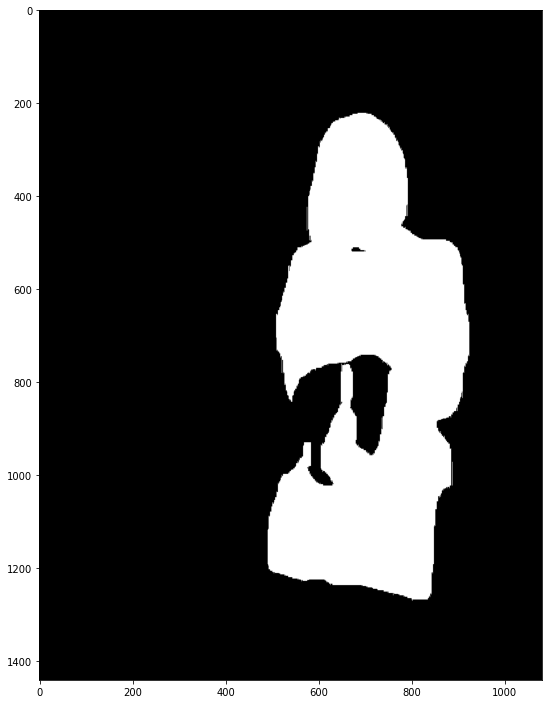

In [31]:
# 흑백영상에 팽창연산을 해주었습니다.
binary = cv2.cvtColor(img_mask_me2, cv2.COLOR_BGR2RGB)
dst2 = cv2.dilate(binary, kernel=(3,3), iterations=50)
plt.imshow(dst2)
plt.show()

이미지 형태 유지를 위해 침식 연산도 해주었습니다.

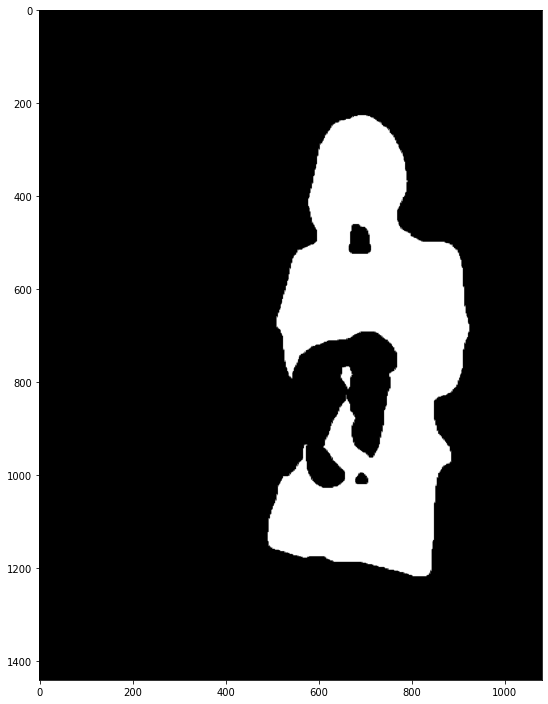

In [32]:
binary = cv2.cvtColor(img_mask_me2, cv2.COLOR_BGR2RGB)
dst2 = cv2.erode(binary, kernel=(3,3), iterations=5)
plt.imshow(dst2)
plt.show()

팽창과 침식을 반복하면서 이미지 형태 유지에는 좋겠지만 커다란 구멍을 매꾸기에는 불가능해보입니다. 그래서 다른 방법을 찾아보다가, 제가 사용한 팽창방법이 십자가 팽창임을 알게되었고, 사각형과 타원형 옵션의 팽창방법을 발견하고 적용해 보았습니다.

참고링크 : - 사각형 열림 닫힘 : https://stackoverflow.com/questions/67117928/how-to-decide-on-the-kernel-to-use-for-dilations-opencv-python

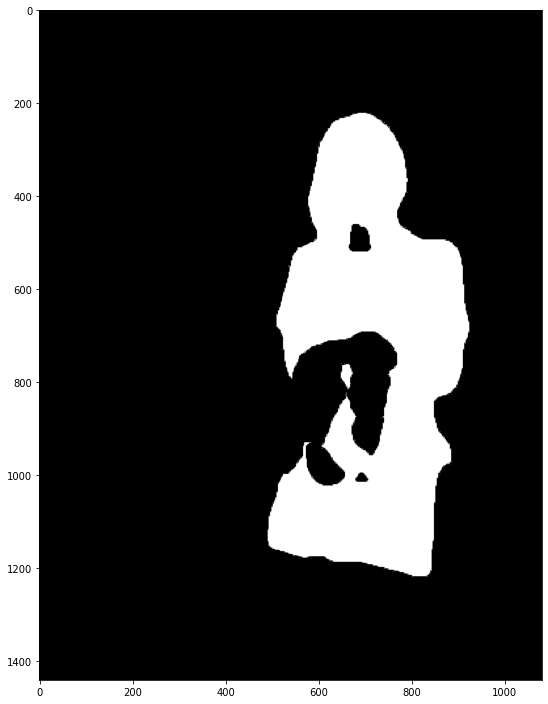

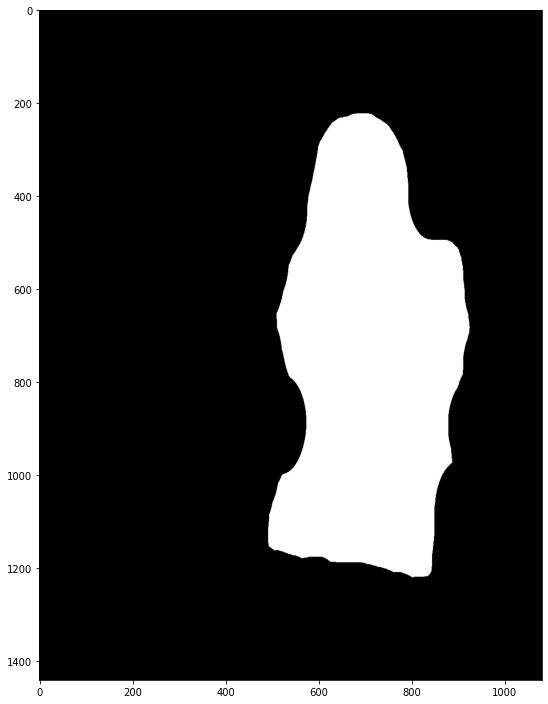

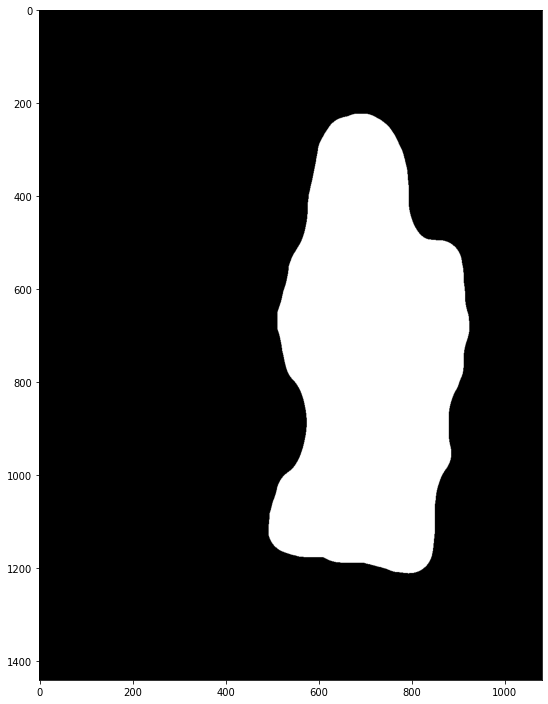

In [33]:
"""
https://stackoverflow.com/questions/67117928/how-to-decide-on-the-kernel-to-use-for-dilations-opencv-python
"""
thresh = cv2.threshold(binary, 0, 255, cv2.THRESH_BINARY)[1]

# 커널이 가로로 길어야 주변 픽셀에 영향을 받아서 빈곳이 매꾸어지므로,
# 완벽한 원이 아니라 가로로 긴 타원으로 모폴로지 닫힘 연산을 해주었습니다.
kernel = cv2.getStructuringElement(cv2.MORPH_ELLIPSE, (100,200))
morph2 = cv2.morphologyEx(binary, cv2.MORPH_CLOSE, kernel)

kernel = cv2.getStructuringElement(cv2.MORPH_ELLIPSE, (100,100))
morph1 = cv2.morphologyEx(morph2, cv2.MORPH_OPEN, kernel)

plt.imshow(thresh)
plt.show()
plt.imshow(morph2)
plt.show()
plt.imshow(morph1)
plt.show()


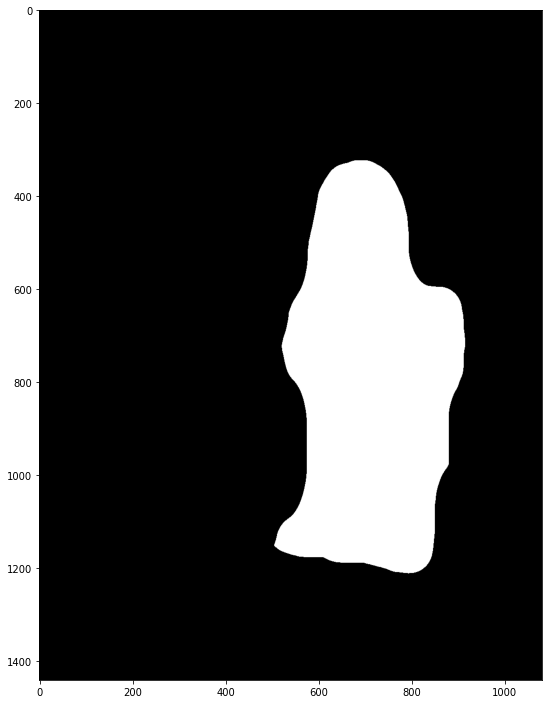

In [34]:
img_aft_cl_op_eroded = cv2.erode(morph1, kernel=(3,3), iterations=100)
plt.imshow(img_aft_cl_op_eroded)
plt.show()

여러 결과물이 생겼지만 어쨌든 내장이 생겼네요~!

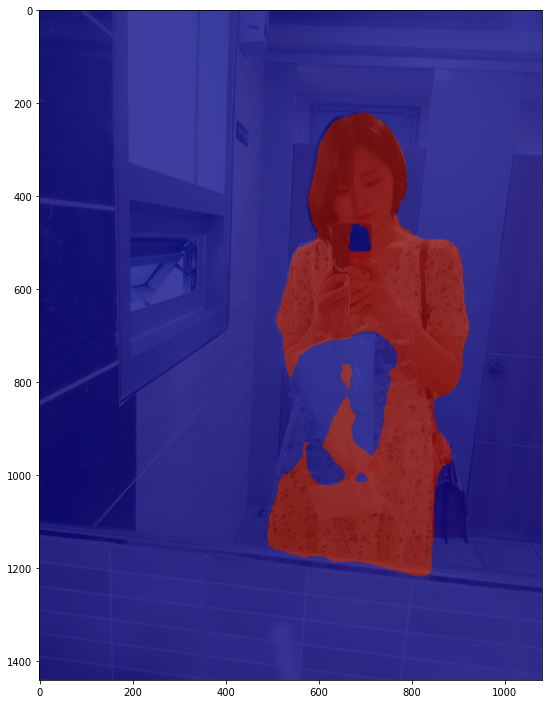

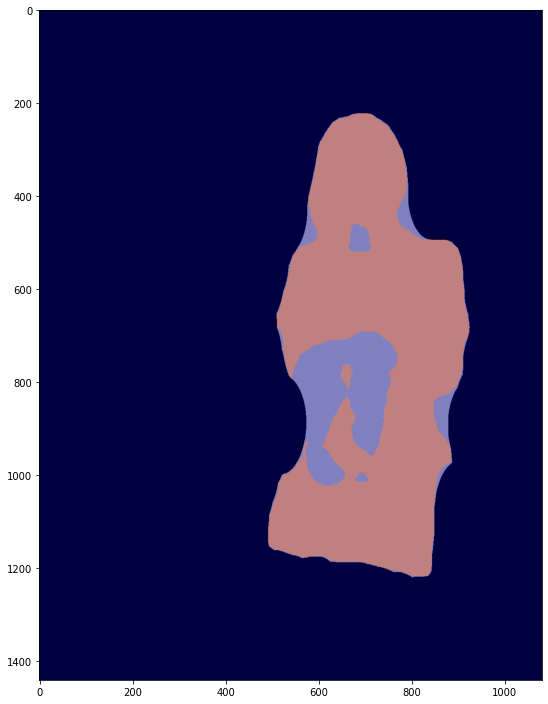

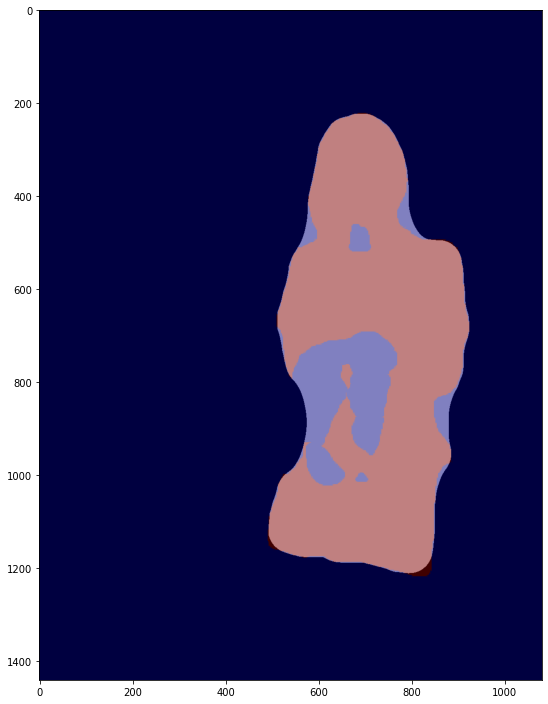

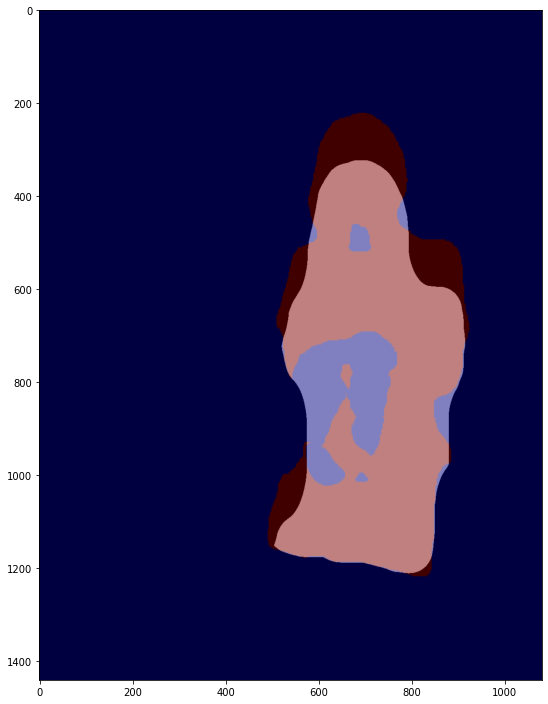

In [35]:

# 원본 이미지와 마스트를 적당히 합쳐봅니다
# 0.6과 0.4는 두 이미지를 섞는 비율입니다.
img_chk_ori= cv2.addWeighted(img_show_me2, 0.5, color_mask_me2, 0.5, 0.0)
plt.imshow(cv2.cvtColor(img_chk_ori, cv2.COLOR_BGR2RGB))
plt.show()

# 원본 이미지와 마스트를 적당히 합쳐봅니다
# 0.6과 0.4는 두 이미지를 섞는 비율입니다.
img_chk_morph2 = cv2.addWeighted(morph2, 0.5, color_mask_me2, 0.5, 0.0)
plt.imshow(cv2.cvtColor(img_chk_morph2, cv2.COLOR_BGR2RGB))
plt.show()

img_chk_morph1 = cv2.addWeighted(morph1, 0.5, color_mask_me2, 0.5, 0.0)
plt.imshow(cv2.cvtColor(img_chk_morph1, cv2.COLOR_BGR2RGB))
plt.show()

img_chk_eroded = cv2.addWeighted(img_aft_cl_op_eroded, 0.5, color_mask_me2, 0.5, 0.0)
plt.imshow(cv2.cvtColor(img_chk_eroded, cv2.COLOR_BGR2RGB))
plt.show()

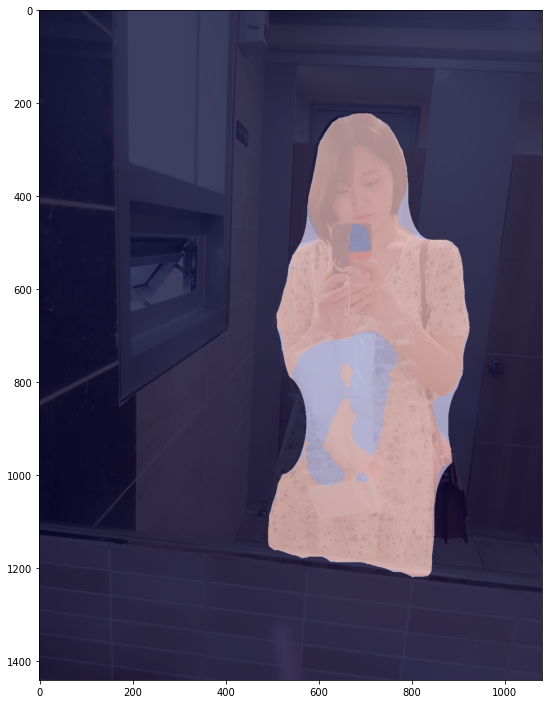

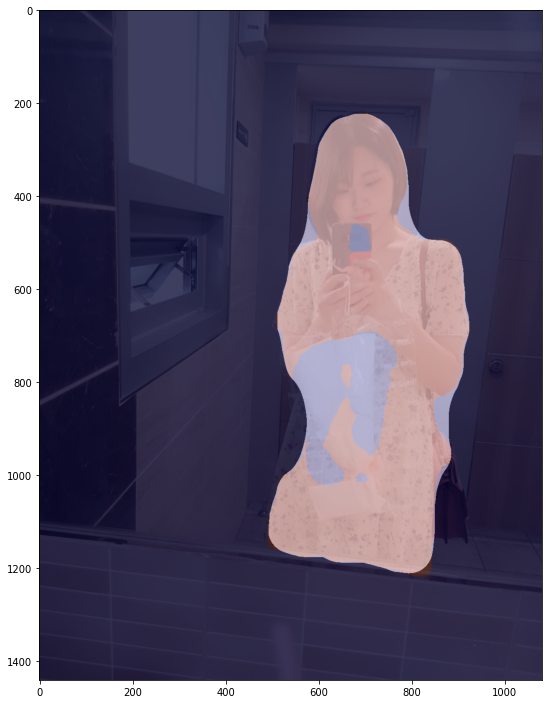

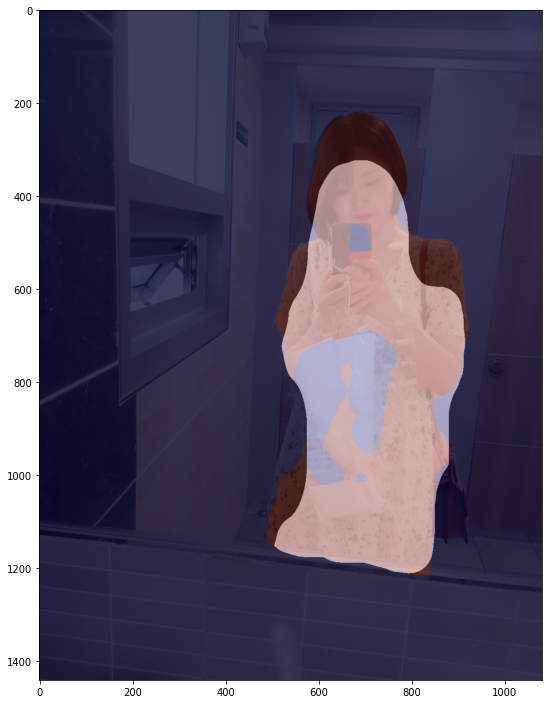

In [36]:
img_chk_morph2 = cv2.addWeighted(morph2, 0.5, img_show_me2, 0.5, 0.0)
plt.imshow(cv2.cvtColor(img_chk_morph2, cv2.COLOR_BGR2RGB))
plt.show()

img_chk_morph1 = cv2.addWeighted(morph1, 0.5, img_show_me2, 0.5, 0.0)
plt.imshow(cv2.cvtColor(img_chk_morph1, cv2.COLOR_BGR2RGB))
plt.show()

img_chk_eroded = cv2.addWeighted(img_aft_cl_op_eroded, 0.5, img_show_me2, 0.5, 0.0)
plt.imshow(cv2.cvtColor(img_chk_eroded, cv2.COLOR_BGR2RGB))
plt.show()

머리 부분의 디테일 형태는 날아갔지만, 그래도 가장 자연스러운 두번째 결과를 이용하여 인물모드를 적용해보려고 합니다. (내장이 생긴것에 만족,,)

4-3 배경을 블러처리한 후 원본사진과 합성하기
---------


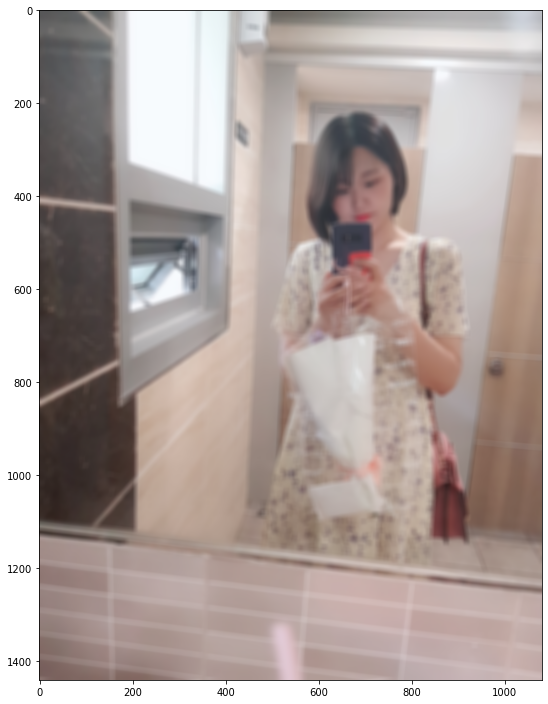

In [37]:
# 블러처리 cv2.blur
img_me2_blur = cv2.blur(img_me2, (13,13))  
plt.imshow(cv2.cvtColor(img_me2_blur, cv2.COLOR_BGR2RGB))
plt.show()

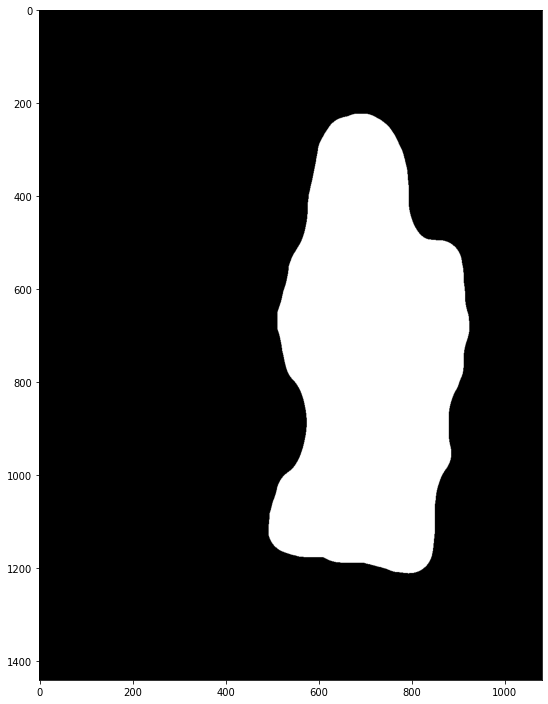

In [38]:
plt.imshow(morph1)
plt.show()

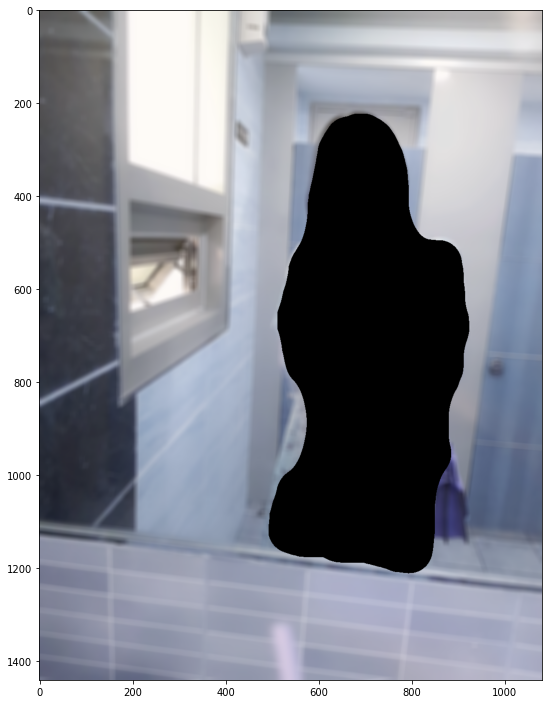

In [39]:
# 배경만 블러된 사진 얻기
img_bg_mask_me2 = cv2.bitwise_not(morph1)
img_bg_blur_me2 = cv2.bitwise_and(img_me2_blur, img_bg_mask_me2)
plt.imshow(img_bg_blur_me2)
plt.show()

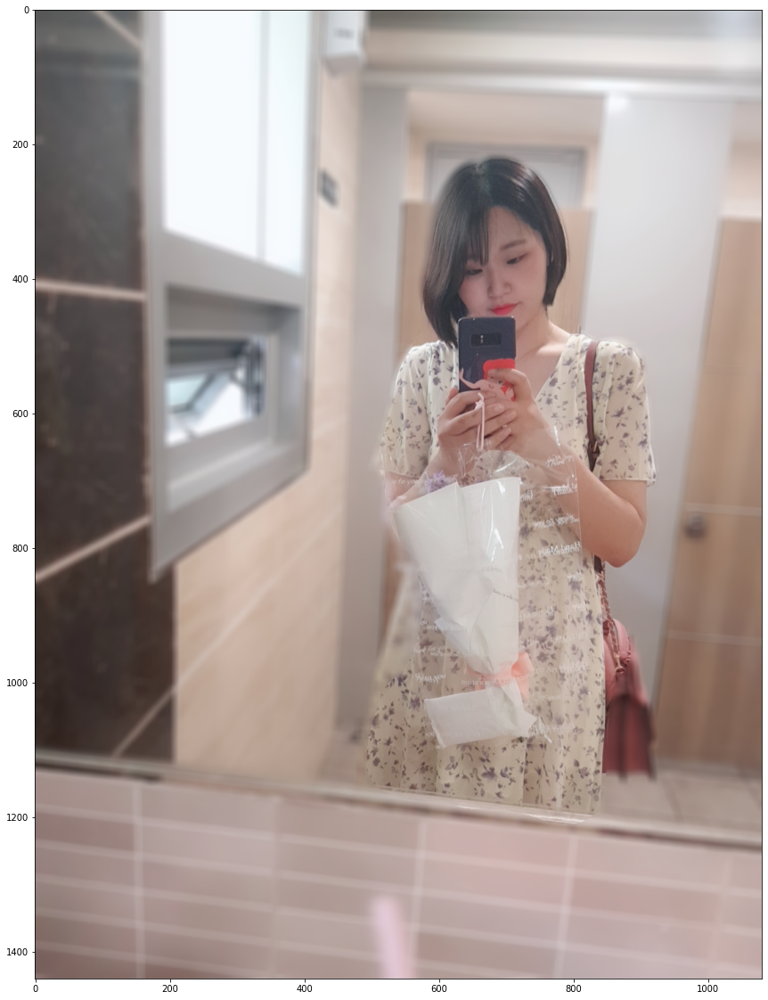

In [40]:
# 원본 영상과 합체~!
plt.rcParams["figure.figsize"] = (15,20)
img_concat_me2 = np.where(morph1==255, img_me2, img_bg_blur_me2)
plt.imshow(cv2.cvtColor(img_concat_me2, cv2.COLOR_BGR2RGB))
plt.show()

# 5. 인물 사진에 크로마키하기

5-1 인물 인식하기
----

(2560, 1440)


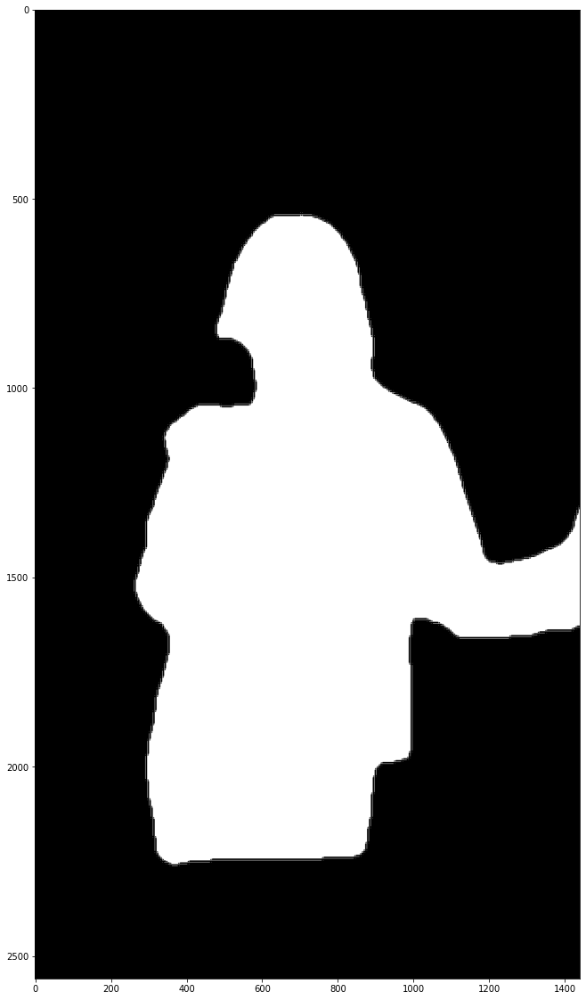

In [41]:
seg_map_me3 = np.all(output_me3==seg_color_person, axis=-1)
print(seg_map_me3.shape)
plt.imshow(seg_map_me3, cmap='gray')
plt.show()

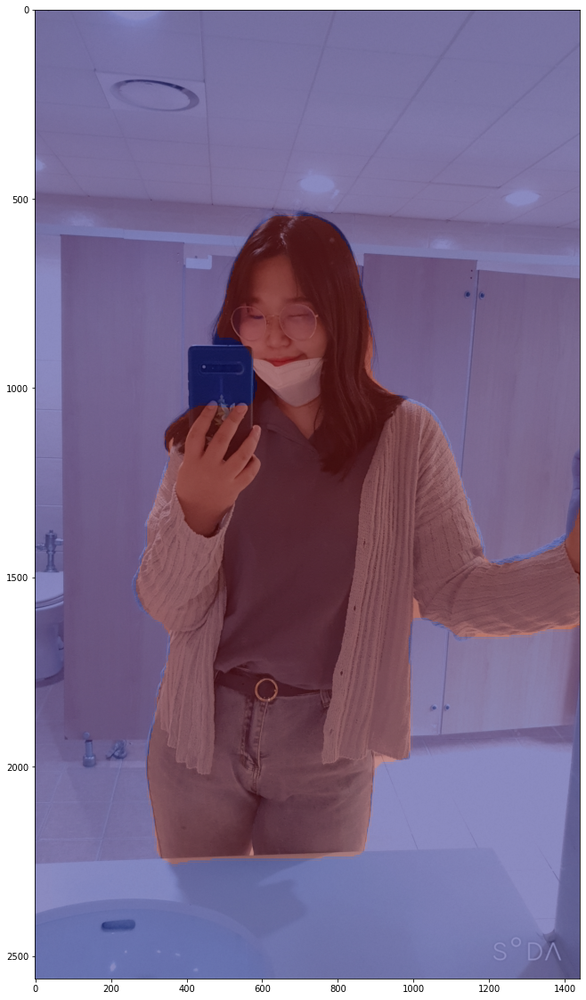

In [42]:
# 원래이미지와 곂쳐보기

img_show_me3 = img_me3.copy()

# True과 False인 값을 각각 255과 0으로 바꿔줍니다
img_mask_me3 = seg_map_me3.astype(np.uint8) * 255

# 255와 0을 적당한 색상으로 바꿔봅니다
color_mask_me3 = cv2.applyColorMap(img_mask_me3, cv2.COLORMAP_JET)

# 원본 이미지와 마스트를 적당히 합쳐봅니다
# 0.6과 0.4는 두 이미지를 섞는 비율입니다.
img_show_me3 = cv2.addWeighted(img_show_me3, 0.6, color_mask_me3, 0.4, 0.0)

plt.imshow(cv2.cvtColor(img_show_me3, cv2.COLOR_BGR2RGB))
plt.show()

5-2 배경을 블러처리 한 후 원본 사진과 합성하기
----------

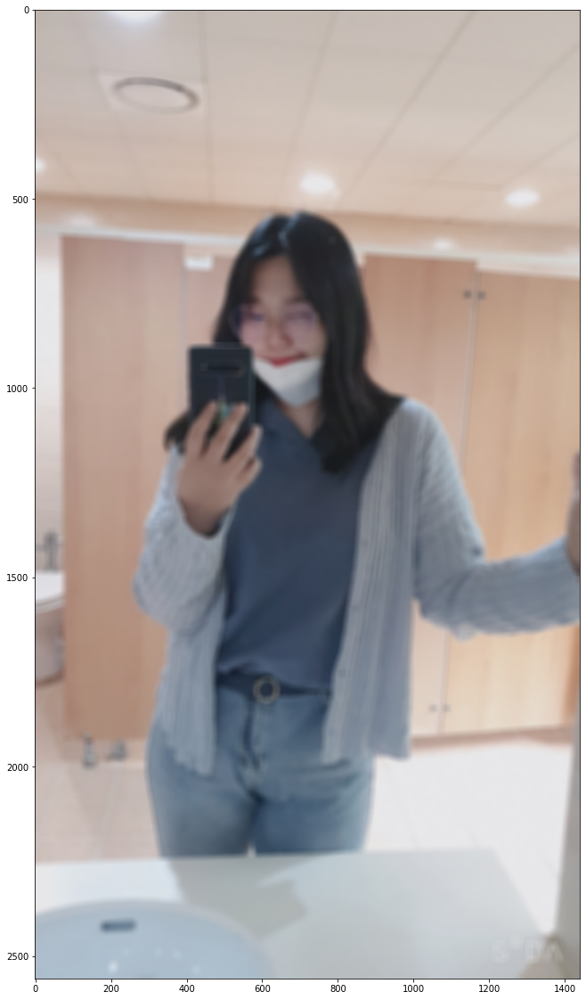

In [43]:
# 블러처리 cv2.blur
img_me3_blur = cv2.blur(img_me3, (20,20))  
plt.imshow(cv2.cvtColor(img_me3_blur, cv2.COLOR_BGR2RGB))
plt.show()

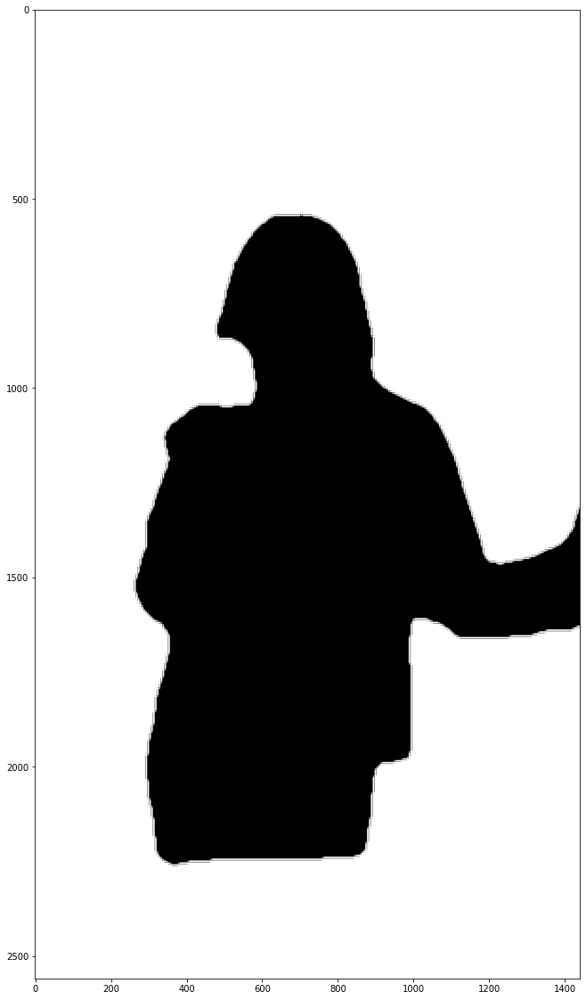

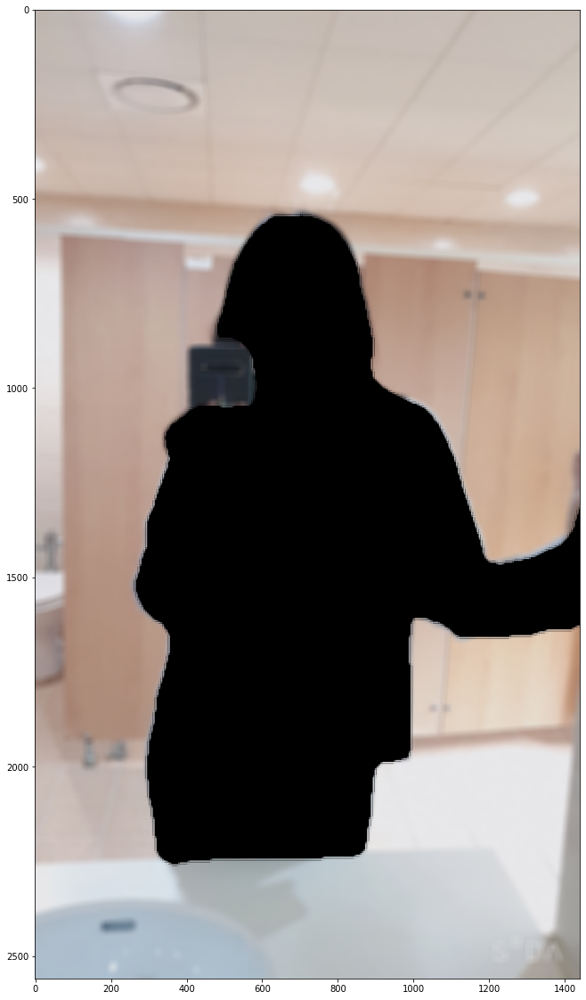

In [44]:
# 배경만 블러된 사진 얻기
img_mask_color = cv2.cvtColor(img_mask_me3, cv2.COLOR_GRAY2BGR)
img_bg_mask = cv2.bitwise_not(img_mask_color)
plt.imshow(img_bg_mask)
plt.show()
img_bg_blur = cv2.bitwise_and(img_me3_blur, img_bg_mask)
plt.imshow(cv2.cvtColor(img_bg_blur, cv2.COLOR_BGR2RGB))
plt.show()

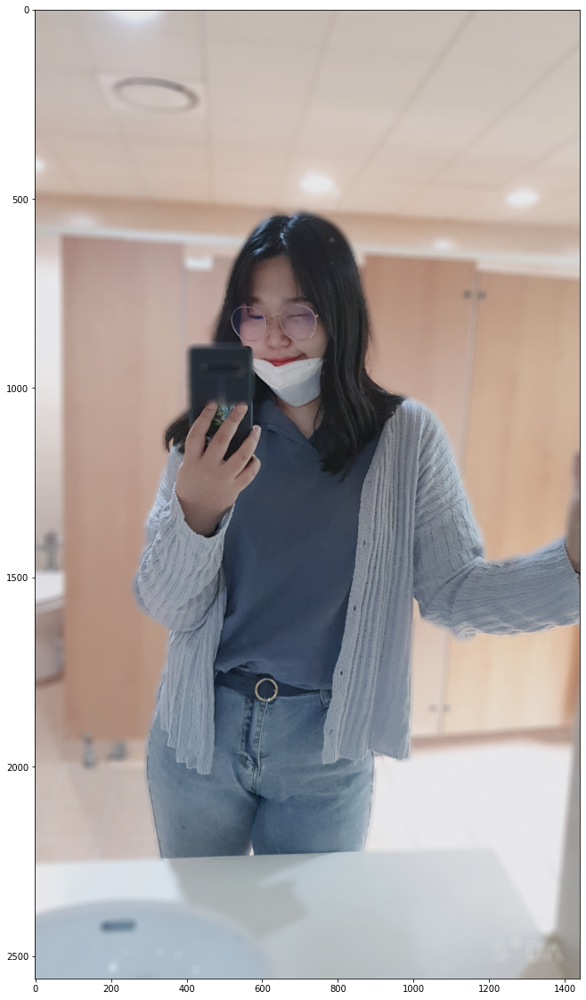

In [45]:
img_concat = np.where(img_mask_color==255, img_me3, img_bg_blur)
plt.imshow(cv2.cvtColor(img_concat, cv2.COLOR_BGR2RGB))
plt.show()

# 6. 회고

오늘의 프로젝트는 이미 촬영된 사진을 이용하여 후처리를 하는 것이라, 최대한 이미지 처리에 중점을 두고 프로젝트를 개선해보았습니다. 만약 센서를 추가로 달 수 있다면, 깊이 카메라 혹은 라이다를 설치하여 거리 데이터를 더 가져오고싶습니다.

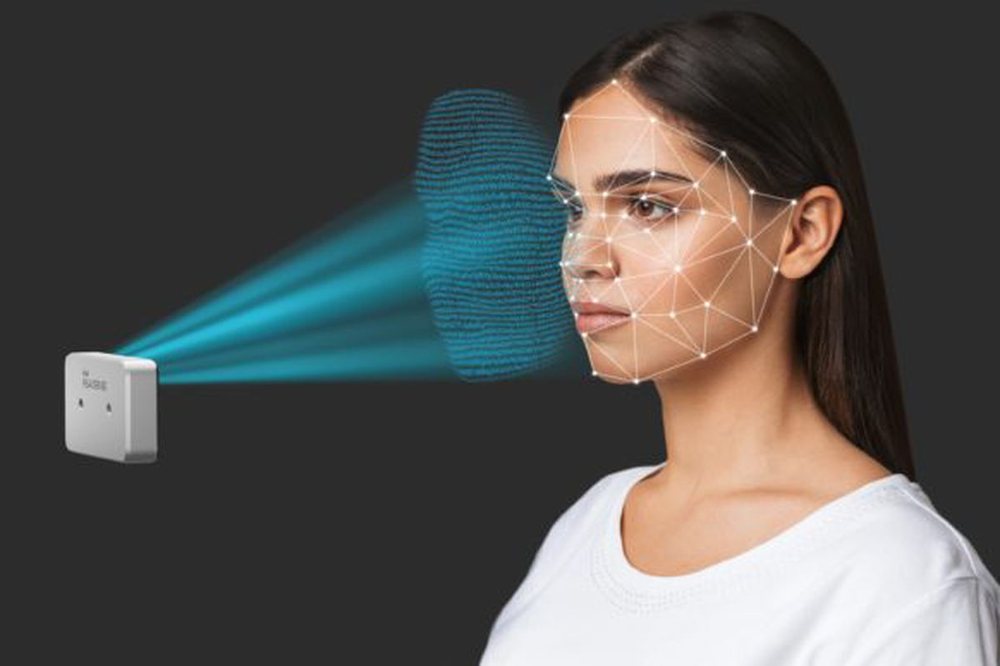

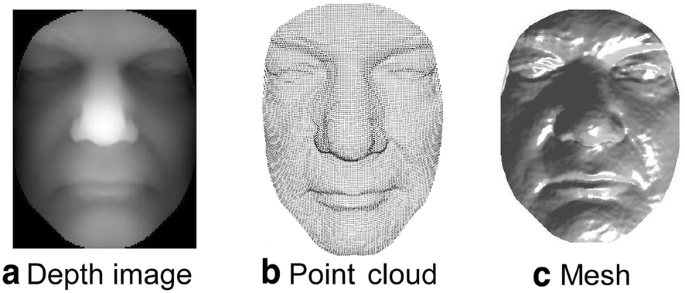

카메라에서 거리정보를 시각화하면, 코가 가장 높게 나옵니다. (사람 얼굴에서 코가 가장 높은 위치에 존재하기 때문) 이를 바탕으로 얼굴인식을 하는 것인데, 저는 이 코를 정점으로, 얼굴인식을 하고, 감지된 얼굴 영역을 바탕으로, 객체를 인식하게 되면, 얼굴 인식률은 더 높아질 것입니다.

아웃포커싱의 목적은 배경이나 물체에 시선을 빼앗기지 않고, 인물에 초점을 맞추는 것이기 때문에, 얼굴 인식률이 높아지기만 하면, 성능개선에는 충분하다고 생각합니다.

또한, 거리정보를 이용할 수있다면, 사진에서 a~b거리인 물체만 원본으로, 나머지는 blurring 처리를 해줌으로써 얕은 피사계 심도로 촬영된 사진

 
참고 사이트
---
- 깊이 카메라 https://m.blog.naver.com/panoptics/221336152952